In [ ]:
import configparser

# --- VÁ LỖI PYTHON 3.12 ---
# Python 3.12 đã xóa SafeConfigParser, ta gán nó bằng ConfigParser hiện đại
if not hasattr(configparser, 'SafeConfigParser'):
    configparser.SafeConfigParser = configparser.ConfigParser
    print("✅ Đã vá lỗi SafeConfigParser thành công!")

In [ ]:
# Gỡ bỏ phiên bản hiện tại để tránh lỗi cache
!pip uninstall -y numpy opencv-python-headless opencv-python stardist csbdeep

# Cài đặt lại phiên bản tương thích (Numpy 1.x và OpenCV cũ hơn một chút)
!pip install "numpy<2.0.0" "opencv-python-headless<4.10"
!pip install stardist csbdeep

print("✅ Đã cài đặt xong. VUI LÒNG KHỞI ĐỘNG LẠI RUNTIME (Xem hướng dẫn bên dưới)")

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: opencv-python-headless 4.9.0.80
Uninstalling opencv-python-headless-4.9.0.80:
  Successfully uninstalled opencv-python-headless-4.9.0.80
Found existing installation: stardist 0.9.1
Uninstalling stardist-0.9.1:
  Successfully uninstalled stardist-0.9.1
Found existing installation: csbdeep 0.8.1
Uninstalling csbdeep-0.8.1:
  Successfully uninstalled csbdeep-0.8.1
  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached opencv_python_headless-4.9.0.80-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
Using cached opencv_python_headless-4.9.0.80-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (49.6 MB)
ERROR: pip's dependency resolver does not currently take into acco

  Using cached stardist-0.9.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (21 kB)
  Using cached csbdeep-0.8.1-py2.py3-none-any.whl.metadata (2.4 kB)
Using cached stardist-0.9.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.1 MB)
Using cached csbdeep-0.8.1-py2.py3-none-any.whl (71 kB)


✅ Đã cài đặt xong. VUI LÒNG KHỞI ĐỘNG LẠI RUNTIME (Xem hướng dẫn bên dưới)


## 1. Mount Google Drive và Upload Data

In [ ]:

from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Tạo thư mục làm việc
work_dir = '/content/stardist_project'
os.makedirs(work_dir, exist_ok=True)
os.chdir(work_dir)

print(f"✅ Working directory: {os.getcwd()}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Working directory: /content/stardist_project


### Upload dữ liệu

**CÁCH 1: Upload từ máy tính (nếu file < 100MB)**

In [ ]:
from google.colab import files
import zipfile
import os

print("📤 Chọn file my_dataset.zip hoặc my_dataset.rar để upload")
print("   (Nén thư mục my_dataset/train và my_dataset/val thành zip/rar trước)")

uploaded = files.upload()

# Giải nén
for filename in uploaded.keys():
    if filename.endswith('.zip'):
        print(f"Extracting {filename}...")
        with zipfile.ZipFile(filename, 'r') as zip_ref:
            zip_ref.extractall('.')
        print(f"✅ Extracted!")
    elif filename.endswith('.rar'):
        print(f"Extracting {filename}...")
        # Cài đặt unrar-free nếu chưa có
        !apt-get install unrar-free -qq
        !unrar x -o+ "{filename}"
        print(f"✅ Extracted!")
    else:
        print(f"⚠️ File {filename} không phải là .zip hay .rar, bỏ qua giải nén.")

# Kiểm tra
!ls -la

📤 Chọn file my_dataset.zip hoặc my_dataset.rar để upload
   (Nén thư mục my_dataset/train và my_dataset/val thành zip/rar trước)


total 8
drwxr-xr-x 2 root root 4096 Nov 22 16:04 .
drwxr-xr-x 1 root root 4096 Nov 22 16:04 ..


**CÁCH 2: Copy từ Google Drive (KHUYẾN NGHỊ nếu file lớn)**

In [ ]:
!apt-get install unrar

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


In [ ]:
import os
import shutil
import subprocess

# 1. ĐƯỜNG DẪN FILE (Giữ nguyên đuôi .rar, không đổi thành .zip)
drive_dataset_path = '/content/drive/MyDrive/my_dataset.rar'
local_filename = 'my_dataset.rar'

if os.path.exists(drive_dataset_path):
    print("Copying from Google Drive...")
    # Copy và giữ nguyên tên file .rar
    shutil.copy2(drive_dataset_path, local_filename)

    print("Extracting RAR file...")

    # 2. GIẢI NÉN BẰNG LỆNH UNRAR
    # 'x' là lệnh giải nén (extract), '-y' là tự động ghi đè (yes to all)
    try:
        result = subprocess.run(['unrar', 'x', '-y', local_filename],
                                capture_output=True, text=True)

        if result.returncode == 0:
            print("✅ Dataset copied and extracted successfully!")
        else:
            print("❌ Lỗi khi giải nén:")
            print(result.stderr)

    except FileNotFoundError:
        print("⚠️ Lỗi: Chưa cài đặt 'unrar'. Hãy chạy '!apt-get install unrar' trước.")

else:
    print(f"⚠️ Không tìm thấy file tại: {drive_dataset_path}")
    print("   Hãy kiểm tra lại đường dẫn trên Google Drive.")

Copying from Google Drive...
Extracting RAR file...
✅ Dataset copied and extracted successfully!


## 2. Cài đặt thư viện

In [ ]:
# Cài đặt StarDist và dependencies
!pip install stardist csbdeep tensorflow -q

print("✅ Packages installed!")

✅ Packages installed!


## 3. Import thư viện và kiểm tra GPU

In [ ]:
# 1. Gỡ bỏ mạnh tay các thư viện liên quan
!pip uninstall -y numpy opencv-python opencv-python-headless stardist csbdeep

# 2. Cài lại đúng phiên bản tương thích với nhau (Quan trọng!)
# Numpy bản 1.x đi kèm với OpenCV bản cũ hơn để tránh lỗi
!pip install "numpy<2.0.0" "opencv-python-headless<4.10" "opencv-python<4.10"

# 3. Cài lại stardist
!pip install stardist csbdeep

print("✅ ĐÃ CÀI XONG. BẮT BUỘC PHẢI LÀM BƯỚC 2 DƯỚI ĐÂY!")

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: opencv-python-headless 4.9.0.80
Uninstalling opencv-python-headless-4.9.0.80:
  Successfully uninstalled opencv-python-headless-4.9.0.80
Found existing installation: stardist 0.9.1
Uninstalling stardist-0.9.1:
  Successfully uninstalled stardist-0.9.1
Found existing installation: csbdeep 0.8.1
Uninstalling csbdeep-0.8.1:
  Successfully uninstalled csbdeep-0.8.1
  Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached opencv_python_headless-4.9.0.80-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
Using cached numpy-1.26.4-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.0 MB)
Using cached opencv_python_headless-4.9.0.80-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (49.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 10.1 MB/s

  Using cached stardist-0.9.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (21 kB)
  Using cached csbdeep-0.8.1-py2.py3-none-any.whl.metadata (2.4 kB)
Using cached stardist-0.9.1-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.1 MB)
Using cached csbdeep-0.8.1-py2.py3-none-any.whl (71 kB)


✅ ĐÃ CÀI XONG. BẮT BUỘC PHẢI LÀM BƯỚC 2 DƯỚI ĐÂY!


In [ ]:
# Không cần !pip install ở đây nữa
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tqdm import tqdm
from pathlib import Path
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

from csbdeep.utils import normalize
from stardist import fill_label_holes, random_label_cmap, calculate_extents
from stardist.matching import matching_dataset
from stardist.models import Config2D, StarDist2D, StarDistData2D

import tensorflow as tf

np.random.seed(42)
lbl_cmap = random_label_cmap()

print(f"Numpy version: {np.__version__}") # Sẽ hiện 1.2x.x là đúng
print(f"TensorFlow version: {tf.__version__}")

if len(tf.config.list_physical_devices('GPU')) > 0:
    print("\n🚀 GPU detected! Training will be FAST.")
else:
    print("\n⚠️ No GPU! Hãy bật GPU: Runtime > Change runtime type > GPU")

Numpy version: 1.26.4
TensorFlow version: 2.19.0

🚀 GPU detected! Training will be FAST.


In [ ]:
# Dán đường dẫn bạn vừa copy vào bên trong dấu ngoặc kép ""
file_path = "/content/stardist_project/my_dataset.rar"  # <-- PASTE VÀO ĐÂY

import os
if os.path.exists(file_path):
    print("✅ Tìm thấy file! Đang giải nén...")
    !unrar x "$file_path"
    print("✅ Đã giải nén xong. Hãy bấm nút Refresh thư mục bên trái để thấy folder my_dataset.")
else:
    print("❌ Vẫn không tìm thấy file! Hãy kiểm tra lại xem bạn đã upload file lên chưa?")
    # Kiểm tra xem đang có những file nào ở thư mục hiện tại
    print("\nCác file hiện có tại thư mục này:")
    !ls -R

✅ Tìm thấy file! Đang giải nén...

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/stardist_project/my_dataset.rar

Creating    my_dataset                                                OK
Creating    my_dataset/to_annotate                                    OK
Creating    my_dataset/to_annotate/images                             OK
Extracting  my_dataset/to_annotate/images/frame_0001.png                   0%  OK 
Extracting  my_dataset/to_annotate/images/frame_0023.png                   2%  OK 
Extracting  my_dataset/to_annotate/images/frame_0045.png                   3%  OK 
Extracting  my_dataset/to_annotate/images/frame_0067.png                   4%  OK 
Extracting  my_dataset/to_annotate/images/frame_0089.png                   5%  OK 
Extracting  my_dataset/to_annotate/images/frame_0111.png                   6%  OK 
Extracting  my_dataset/to_annotate/images/frame_0133.png     

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 4. Load dữ liệu

In [ ]:
# Đường dẫn đến dataset
data_dir = Path('my_dataset')

# Load training data
X_train_files = sorted(glob(str(data_dir / 'train' / 'images' / '*')))
Y_train_files = sorted(glob(str(data_dir / 'train' / 'masks' / '*')))

# Load validation data
X_val_files = sorted(glob(str(data_dir / 'val' / 'images' / '*')))
Y_val_files = sorted(glob(str(data_dir / 'val' / 'masks' / '*')))

print(f"Training set: {len(X_train_files)} images")
print(f"Validation set: {len(X_val_files)} images")

# Kiểm tra
assert len(X_train_files) > 0, "⚠️ Không tìm thấy ảnh training! Kiểm tra lại thư mục."
assert len(X_train_files) == len(Y_train_files), "⚠️ Số lượng ảnh và masks không khớp!"
assert len(X_val_files) == len(Y_val_files), "⚠️ Số lượng ảnh và masks validation không khớp!"

# Load vào memory
print("\nLoading images...")
X_train = [np.array(Image.open(f)) for f in tqdm(X_train_files, desc="Train images")]
Y_train = [np.array(Image.open(f)) for f in tqdm(Y_train_files, desc="Train masks")]
X_val = [np.array(Image.open(f)) for f in tqdm(X_val_files, desc="Val images")]
Y_val = [np.array(Image.open(f)) for f in tqdm(Y_val_files, desc="Val masks")]

print("\n✅ Data loaded successfully!")

Training set: 30 images
Validation set: 10 images

Loading images...


Val masks: 100%|██████████| 10/10 [00:00<00:00, 263.66it/s]


✅ Data loaded successfully!


## 5. Preprocessing

In [ ]:
# Kiểm tra số channel
n_channel = 1 if X_train[0].ndim == 2 else X_train[0].shape[-1]
print(f"Number of channels: {n_channel}")

# Normalize ảnh
axis_norm = (0,1)
X_train = [normalize(x, 1, 99.8, axis=axis_norm) for x in tqdm(X_train, desc="Normalize train")]
X_val = [normalize(x, 1, 99.8, axis=axis_norm) for x in tqdm(X_val, desc="Normalize val")]

# Fill label holes
Y_train = [fill_label_holes(y) for y in tqdm(Y_train, desc="Fill holes train")]
Y_val = [fill_label_holes(y) for y in tqdm(Y_val, desc="Fill holes val")]

print("\n✅ Preprocessing completed!")

Number of channels: 3


Fill holes val: 100%|██████████| 10/10 [00:00<00:00, 26.79it/s]


✅ Preprocessing completed!


## 6. Visualize samples

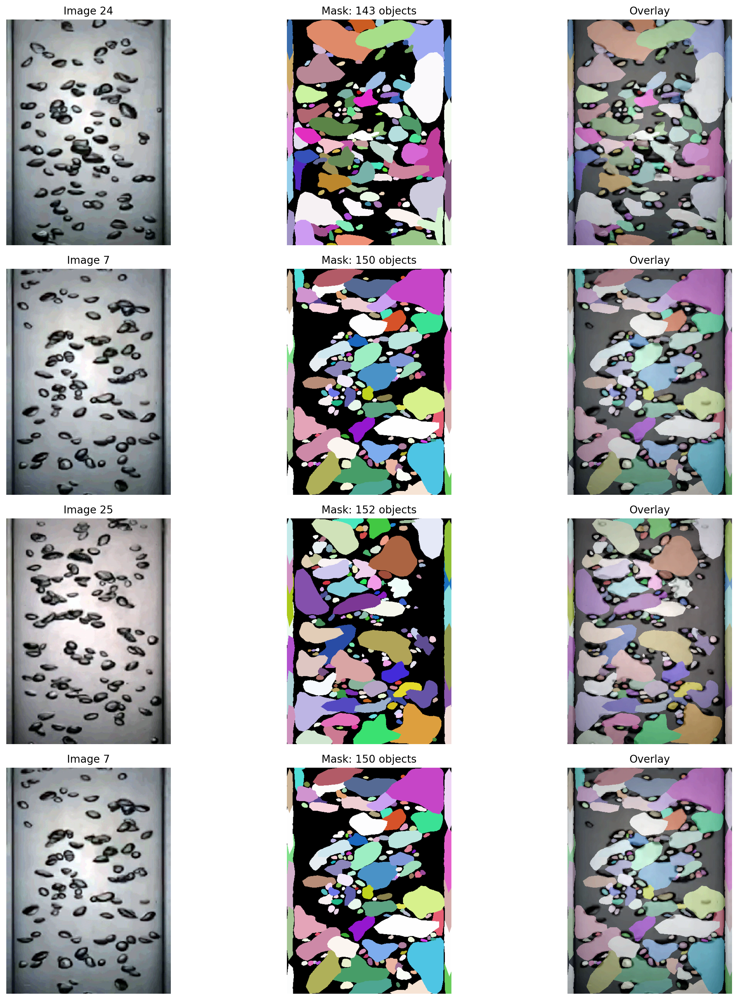

In [ ]:
# Xem 4 cặp ảnh-mask
fig, axes = plt.subplots(4, 3, figsize=(15, 16))

for i in range(4):
    idx = np.random.randint(len(X_train))
    img = X_train[idx]
    mask = Y_train[idx]

    axes[i,0].imshow(img if img.ndim == 3 else img, cmap='gray' if img.ndim == 2 else None)
    axes[i,0].set_title(f"Image {idx}")
    axes[i,0].axis('off')

    axes[i,1].imshow(mask, cmap=lbl_cmap)
    n_objects = len(np.unique(mask)) - 1
    axes[i,1].set_title(f"Mask: {n_objects} objects")
    axes[i,1].axis('off')

    axes[i,2].imshow(img if img.ndim == 3 else img, cmap='gray' if img.ndim == 2 else None)
    axes[i,2].imshow(mask, cmap=lbl_cmap, alpha=0.5)
    axes[i,2].set_title("Overlay")
    axes[i,2].axis('off')

plt.tight_layout()
plt.show()

## 7. Cấu hình Model

In [ ]:
# Tham số
n_rays = 64
grid = (2, 2)
use_gpu = True
n_channel_in = n_channel

# Tính train_patch_size
img_size = X_train[0].shape[:2]
train_patch_size = (256, 256) if min(img_size) < 512 else (512, 512)

print(f"Image size: {img_size}")
print(f"Train patch size: {train_patch_size}")

# Config
conf = Config2D(
    n_rays=n_rays,
    grid=grid,
    use_gpu=use_gpu,
    n_channel_in=n_channel_in,
    train_patch_size=train_patch_size,
    train_epochs=200,
    train_steps_per_epoch=100,
    train_batch_size=4,
    train_loss_weights=(1, 0.2),
    train_learning_rate=0.0003,
    train_reduce_lr={'factor': 0.5, 'patience': 10},
    train_sample_cache=True,
    train_background_reg=0.0001,
)

print("\n✅ Model configured")

Image size: (588, 428)
Train patch size: (256, 256)

✅ Model configured


## 8. Data Augmentation

In [ ]:
def random_fliprot(img, mask, axis=None):
    if axis is None:
        axis = tuple(range(mask.ndim))
    axis = tuple(axis)

    assert img.ndim >= mask.ndim
    perm = tuple(np.random.permutation(axis))
    transpose_axis = np.arange(mask.ndim)
    for a, p in zip(axis, perm):
        transpose_axis[a] = p
    transpose_axis = tuple(transpose_axis)
    img = img.transpose(transpose_axis + tuple(range(mask.ndim, img.ndim)))
    mask = mask.transpose(transpose_axis)
    for ax in axis:
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask

def random_intensity_change(img):
    img = img * np.random.uniform(0.6, 2.0)
    img = img + np.random.uniform(-0.2, 0.2)
    return img

def augmenter(x, y):
    x, y = random_fliprot(x, y, axis=(0, 1))
    x = random_intensity_change(x)
    return x, y

print("✅ Augmentation functions defined")

✅ Augmentation functions defined


## 9. Tạo Model

In [ ]:
model_name = 'stardist_my_data'
model_basedir = 'models'

model = StarDist2D(conf, name=model_name, basedir=model_basedir)

print(f"\n✅ Model created: {model_name}")
print(f"   Location: {model_basedir}/{model_name}")
print(f"   Total parameters: {model.keras_model.count_params():,}")

Using default values: prob_thresh=0.5, nms_thresh=0.4.

✅ Model created: stardist_my_data
   Location: models/stardist_my_data
   Total parameters: 1,429,889


## 10. TRAINING 🚀

In [ ]:
!pip install gputools -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.6/732.6 kB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 127.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.8/98.8 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 11.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.3.5 which is incompatible.
tensorflow 2.19.0 requires numpy<2.2.0,>=1.26.0, but you have numpy 2.3.5 which is incompatibl

In [ ]:
import configparser

# --- BẮT ĐẦU ĐOẠN CODE VÁ LỖI ---
# Python 3.12 đã xóa SafeConfigParser, ta gán nó bằng ConfigParser hiện tại
if not hasattr(configparser, 'SafeConfigParser'):
    configparser.SafeConfigParser = configparser.ConfigParser
# --- KẾT THÚC ĐOẠN CODE VÁ LỖI ---

print("="*60)
print("STARTING TRAINING")
print("="*60)

# Bây giờ mới chạy lệnh train
history = model.train(
    X_train, Y_train,
    validation_data=(X_val, Y_val),
    augmenter=augmenter,
    epochs=conf.train_epochs,
    steps_per_epoch=conf.train_steps_per_epoch,
)

print("\n" + "="*60)
print("✅ TRAINING COMPLETED!")
print("="*60)

STARTING TRAINING
If you want to compute separable approximations, please install it with
pip install scikit-tensor-py3
Epoch 1/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 55s 234ms/step - dist_dist_iou_metric: 0.0356 - dist_loss: 21.1653 - dist_relevant_mae: 21.1650 - dist_relevant_mse: 823.6962 - loss: 4.8585 - prob_kld: 0.3099 - prob_loss: 0.6254 - val_dist_dist_iou_metric: 0.1859 - val_dist_loss: 15.4009 - val_dist_relevant_mae: 15.6636 - val_dist_relevant_mse: 591.7382 - val_loss: 3.6773 - val_prob_kld: 0.2404 - val_prob_loss: 0.5420 - learning_rate: 3.0000e-04
Epoch 2/200
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 85ms/step - dist_dist_iou_metric: 0.2486 - dist_loss: 13.7659 - dist_relevant_mae: 13.7647 - dist_relevant_mse: 423.3729 - loss: 3.3357 - prob_kld: 0.2699 - prob_loss: 0.5826 - val_dist_dist_iou_metric: 0.3127 - val_dist_loss: 12.2305 - val_dist_relevant_mae: 12.3943 - val_dist_relevant_mse: 369.1032 - val_loss: 3.0600 - val_prob_kld: 0.2790 - val_prob_loss: 0.5806 - learning_rate: 3.0000e-0

## 11. Visualize Training History

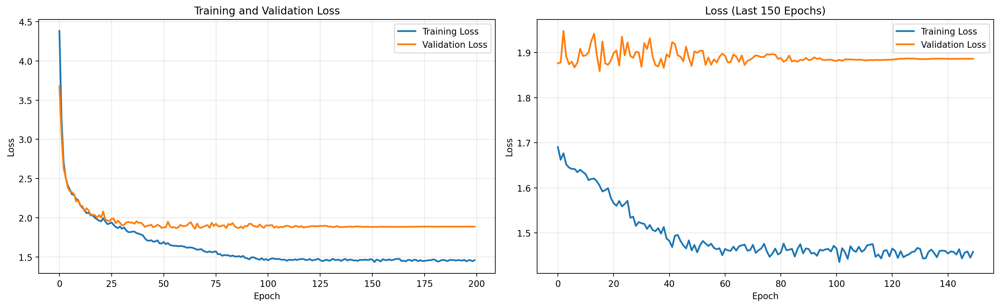


Best epoch: 66/200
Best validation loss: 1.8590


In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

ax1.plot(history.history['loss'], label='Training Loss', linewidth=2)
ax1.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training and Validation Loss')
ax1.legend()
ax1.grid(alpha=0.3)

start_epoch = len(history.history['loss']) // 4
ax2.plot(history.history['loss'][start_epoch:], label='Training Loss', linewidth=2)
ax2.plot(history.history['val_loss'][start_epoch:], label='Validation Loss', linewidth=2)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Loss')
ax2.set_title(f'Loss (Last {len(history.history["loss"]) - start_epoch} Epochs)')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(f'{model_basedir}/{model_name}/training_history.png', dpi=150)
plt.show()

best_epoch = np.argmin(history.history['val_loss']) + 1
best_val_loss = min(history.history['val_loss'])
print(f"\nBest epoch: {best_epoch}/{len(history.history['val_loss'])}")
print(f"Best validation loss: {best_val_loss:.4f}")

## 12. Optimize Thresholds

In [ ]:
print("Optimizing thresholds...\n")

model.optimize_thresholds(
    X_val, Y_val,
    nms_threshs=[0.3, 0.4, 0.5],
    iou_threshs=[0.3, 0.4, 0.5],
)

print(f"\n✅ Optimal NMS threshold: {model.thresholds.nms:.3f}")
print(f"   Optimal prob threshold: {model.thresholds.prob:.3f}")

Optimizing thresholds...



NMS threshold = 0.5:  75%|███████▌  | 15/20 [00:30<00:10,  2.05s/it, 0.507 -> 0.550]


Using optimized values: prob_thresh=0.470729, nms_thresh=0.3.
Saving to 'thresholds.json'.

✅ Optimal NMS threshold: 0.300
   Optimal prob threshold: 0.471


## 13. Evaluate

In [ ]:
print("Evaluating...\n")

Y_val_pred = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in tqdm(X_val, desc="Predicting")]

stats = [matching_dataset(Y_val, Y_val_pred, thresh=t, show_progress=False)
         for t in tqdm([0.5, 0.6, 0.7, 0.8, 0.9], desc="Computing metrics")]

print("\n" + "="*60)
print("VALIDATION RESULTS")
print("="*60)
for (thr, stat) in zip([0.5, 0.6, 0.7, 0.8, 0.9], stats):
    print(f"IoU {thr:.1f}: AP = {stat.mean_matched_score:.3f}")

ap_50 = stats[0].mean_matched_score
print(f"\n🎯 OVERALL SCORE (AP@0.5): {ap_50:.3f}")

Evaluating...



Computing metrics: 100%|██████████| 5/5 [00:00<00:00,  7.72it/s]


VALIDATION RESULTS
IoU 0.5: AP = 0.720
IoU 0.6: AP = 0.747
IoU 0.7: AP = 0.784
IoU 0.8: AP = 0.840
IoU 0.9: AP = 0.915

🎯 OVERALL SCORE (AP@0.5): 0.720


## 14. Visualize Predictions

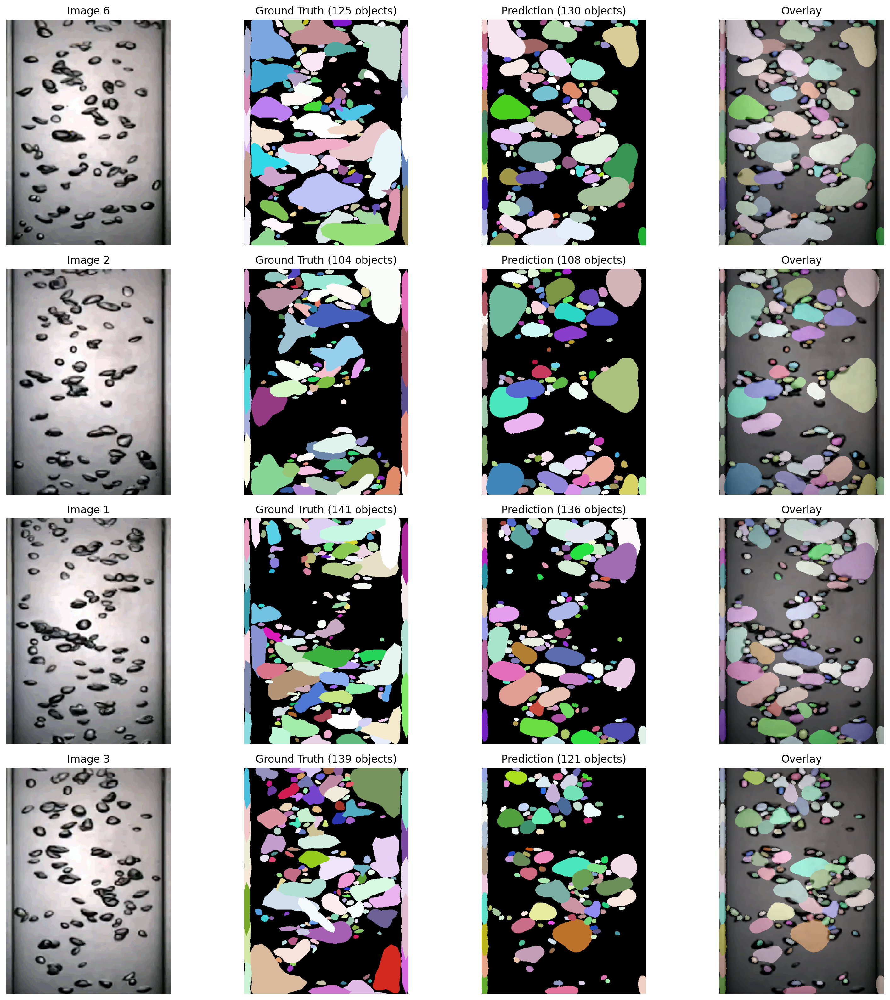

In [ ]:
n_samples = min(4, len(X_val))
sample_indices = np.random.choice(len(X_val), n_samples, replace=False)

fig, axes = plt.subplots(n_samples, 4, figsize=(16, 4*n_samples))
if n_samples == 1:
    axes = axes.reshape(1, -1)

for i, idx in enumerate(sample_indices):
    img = X_val[idx]
    mask_true = Y_val[idx]
    mask_pred = Y_val_pred[idx]

    axes[i, 0].imshow(img if img.ndim == 3 else img, cmap='gray' if img.ndim == 2 else None)
    axes[i, 0].set_title(f"Image {idx}")
    axes[i, 0].axis('off')

    axes[i, 1].imshow(mask_true, cmap=lbl_cmap)
    n_true = len(np.unique(mask_true)) - 1
    axes[i, 1].set_title(f"Ground Truth ({n_true} objects)")
    axes[i, 1].axis('off')

    axes[i, 2].imshow(mask_pred, cmap=lbl_cmap)
    n_pred = len(np.unique(mask_pred)) - 1
    axes[i, 2].set_title(f"Prediction ({n_pred} objects)")
    axes[i, 2].axis('off')

    axes[i, 3].imshow(img if img.ndim == 3 else img, cmap='gray' if img.ndim == 2 else None)
    axes[i, 3].imshow(mask_pred, cmap=lbl_cmap, alpha=0.5)
    axes[i, 3].set_title("Overlay")
    axes[i, 3].axis('off')

plt.tight_layout()
plt.savefig(f'{model_basedir}/{model_name}/predictions.png', dpi=150)
plt.show()

## 15. Download Model về máy

Sau khi training xong, download model về máy để sử dụng.

In [ ]:
import shutil

# Nén model thành zip
model_path = f"{model_basedir}/{model_name}"
shutil.make_archive(f'{model_name}', 'zip', model_basedir, model_name)

print(f"✅ Model đã được nén: {model_name}.zip")
print(f"\n📥 Download file về máy:")

# Download
from google.colab import files
files.download(f'{model_name}.zip')

print("\n💾 Giải nén file .zip và copy thư mục vào models/ trong project của bạn")

✅ Model đã được nén: stardist_my_data.zip

📥 Download file về máy:


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


💾 Giải nén file .zip và copy thư mục vào models/ trong project của bạn


## 16. (Optional) Lưu vào Google Drive

In [ ]:
# Copy model vào Google Drive để lưu trữ lâu dài
drive_save_path = '/content/drive/MyDrive/stardist_models/'
os.makedirs(drive_save_path, exist_ok=True)

shutil.copy2(f'{model_name}.zip', drive_save_path)
print(f"✅ Model đã được lưu vào Google Drive: {drive_save_path}")

✅ Model đã được lưu vào Google Drive: /content/drive/MyDrive/stardist_models/


---

## 🎉 HOÀN THÀNH!

### Các bước tiếp theo:

1. **Download model về máy** (đã nén thành .zip)
2. **Giải nén** vào thư mục `models/` trong project
3. **Chạy notebook** `2_prediction_my_data.ipynb` để predict trên 886 frames

### Load model đã train:

```python
from stardist.models import StarDist2D
model = StarDist2D(None, name='stardist_my_data', basedir='models')
```

---